# Script to analyse the squirmer model simulation with Kapsel
# Author: Federico Fadda
# For suggestions please contact me at $\textit{fede.fadda1110@gmail.com}$ or call me via Skype at $\textit{fedefadda}$.
# References:
# J.J. Molina et al. Soft Matter, 2013, 9, 4923 https://pubs.rsc.org/en/content/articlepdf/2013/sm/c3sm00140g
# N. Oyama et al. Phys. Rev. E 93, 043114 (2016) https://journals.aps.org/pre/pdf/10.1103/PhysRevE.93.043114
# N. Oyama et al. Eur. Phys. J. E (2017) 40: 95 https://link.springer.com/content/pdf/10.1140%2Fepje%2Fi2017-11586-4.pdf

In [1]:
# Loading some usuful libraries of Python:

%matplotlib inline
import numpy as np
import h5py
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.gridspec as gridspec
import math 
from scipy import optimize
import matplotlib.pyplot as plt
from scipy import interpolate 
from scipy.interpolate import RegularGridInterpolator


# Theoretical flow field of the squirmer with formula (3) of J.J. Molina et al. Soft Matter, 2013, 9, 4923-4936

$\mathbf{u}(\mathbf{r})=B_{1}\frac{a^{2}}{r^{2}}\left [ \frac{a}{r} \left ( \frac{2}{3}\mathbf{e} +\sin\theta\boldsymbol{\theta} \right ) +\frac{\alpha}{2}\left \{ \left ( \frac{a^{2}}{r^2}-1 \right )(3\cos^{2}\theta-1)\mathbf{r}+\frac{a^2}{r^{2}}\sin2\theta\boldsymbol{\theta} \right \}\right ]$

a = radius of the squirmer
<br>
$B_{1}$ and $B_{2}$ = first two squirmer modes
<br>
$\textbf{e}$ = direction of motion of the squirmer
<br>
$\boldsymbol{\theta}$ = polar angle between the direction of motion e and a point on the surface of the squirmer
<br>
$\textbf{r}$ = radial unit vector


In [ ]:
n = 63
y, z = np.mgrid[n/2:n, 0:n]
a=5.0
y_cm=32.0
z_cm=32.0
r=np.sqrt((y-y_cm)**2+(z-z_cm)**2)
B1=0.0015
C2=0.1
alpha=-4.0
cos_theta=(z-z_cm)/r
sin_theta=np.sqrt(1.0-cos_theta**2)
sin_2theta=2.0*sin_theta*cos_theta


    
uy= B1*(a**2/r**2)*((a/r)*sin_theta*cos_theta+alpha*0.5*(((a**2/r**2)-1.0)*(3.0*cos_theta**2-1.0)*sin_theta+(a**2/r**2)*sin_2theta*cos_theta))#+3.0*sin_2theta*C2*a**3/(2.0*r**3)
uz= B1*(a**2/r**2)*((a/r)*0.66-(a/r)*sin_theta**2+alpha*0.5*(((a**2/r**2)-1.0)*(3.0*cos_theta**2-1.0)*cos_theta-(a**2/r**2)*sin_2theta*sin_theta))#-0.001


inner1 = r < a
uy[inner1] =0.0
uz[inner1] =0.0


y1, z1 = np.mgrid[0:n/2, 0:n]
r1=np.sqrt((y1-y_cm)**2+(z1-z_cm)**2)
cos_theta1=(z1-z_cm)/r1
sin_theta1=np.sqrt(1.0-cos_theta1**2)
sin_2theta1=2.0*sin_theta1*cos_theta1


    
uy1= B1*(a**2/r1**2)*(-(a/r1)*sin_theta1*cos_theta1+alpha*0.5*(-((a**2/r1**2)-1.0)*(3.0*cos_theta1**2-1.0)*sin_theta1-(a**2/r1**2)*sin_2theta1*cos_theta1))#+3.0*sin_2theta*C2*a**3/(2.0*r**3)
uz1= B1*(a**2/r1**2)*((a/r1)*0.66-(a/r1)*sin_theta1**2+alpha*0.5*(((a**2/r1**2)-1.0)*(3.0*cos_theta1**2-1.0)*cos_theta1-(a**2/r1**2)*sin_2theta1*sin_theta1))#-0.001

inner2 = r1 < a
uy1[inner2] =0.0
uz1[inner2] =0.0

fig, ax = plt.subplots(figsize=(10, 10))
ax.quiver(y, z, uy, uz, scale=0.05, width=0.002,color='C0')
ax.quiver(y1, z1, uy1, uz1, scale=0.05, width=0.002,color='C0')
plt.xlabel('$y/\Delta$',fontsize=20)
plt.ylabel('$z/\Delta$',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim((0,63))
plt.ylim((0,63))

circle=patches.Circle((32.0,32.0),5,facecolor='white',edgecolor='black',linewidth=1,zorder=10)
ax.add_patch(circle)

plt.show()

                                               

# Theoretical azimuthal flow field of the squirmer with formula (23) of O. Pak et al. J. Eng. Math. (2014) 88:1-28


$\sum_{n=1}^{\infty}\frac{\sin\theta P^{m'}_{n}}{r^{n+1}}C_{0n}\boldsymbol{e_\phi}$


$C_{0n}$ = new azimuthal modes
<br>
$\boldsymbol{e_{\phi}}$ = azimuthal unit vector

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in true_divide
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in multiply
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in true_divide
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in multiply
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide


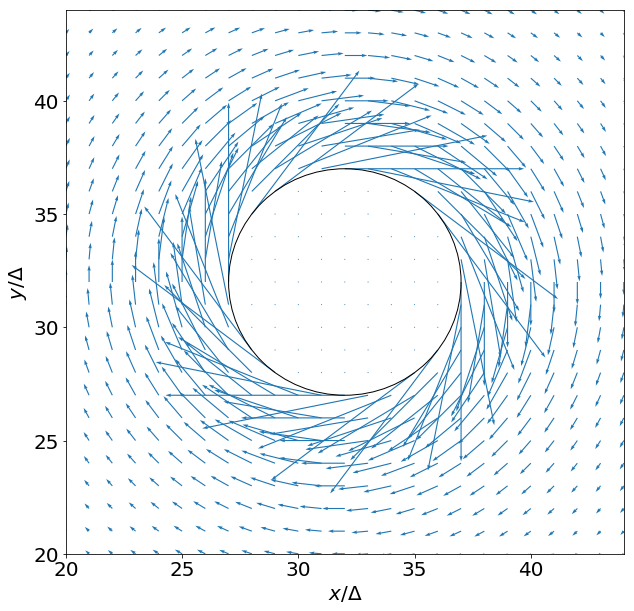

In [35]:
n = 63
x, y = np.mgrid[0:n, 0:n]
a=5.0
x_cm=32.0
y_cm=32.0
r=np.sqrt((x-x_cm)**2+(y-y_cm)**2)
C1=0.0
C2=0.0015
C3=0.0
C4=0.0
C5=0.0
theta=np.pi*0.25*3.0


           
phi=np.arctan2((y-y_cm),(x-x_cm))
                


ux=(1/r**2)*np.sin(theta)*np.sin(phi)*C1*a**2+3.0*np.sin(2.0*theta)*C2*a**3*np.sin(phi)/(2.0*r**3)+1.5*C3*a**4*np.sin(phi)*np.sin(theta)*(5.0*np.cos(theta)**2-1.0)/(r**4)+2.5*(7.0*np.cos(theta)**3-3.0*np.cos(theta))*np.sin(theta)*np.sin(phi)*C4*a**5/(r**5)+1.875*(21.0*np.cos(theta)**4-14.0*np.cos(theta)**2+1.0)*np.sin(theta)*np.sin(phi)*C5*a**6/(r**6)
uy=-(1/r**2)*np.sin(theta)*np.cos(phi)*C1*a**2-3.0*np.sin(2.0*theta)*C2*a**3*np.cos(phi)/(2.0*r**3)-1.5*C3*a**4*np.cos(phi)*np.sin(theta)*(5.0*np.cos(theta)**2-1.0)/(r**4)-2.5*(7.0*np.cos(theta)**3-3.0*np.cos(theta))*np.sin(theta)*np.cos(phi)*C4*a**5/(r**5)-1.875*(21.0*np.cos(theta)**4-14.0*np.cos(theta)**2+1.0)*np.sin(theta)*np.cos(phi)*C5*a**6/(r**6)
inner = r < a
ux[inner] = 0.0 #3e-4*(y[inner]-y_cm)
uy[inner] = 0.0 #-3e-4*(x[inner]-x_cm)

fig, ax = plt.subplots(figsize=(10, 10))
ax.quiver(x, y, -ux, -uy, scale=0.007, width=0.002,color='C0')
plt.xlabel('$x/\Delta$',fontsize=20)
plt.ylabel('$y/\Delta$',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim((20,44))
plt.ylim((20,44))


circle=patches.Circle((32.0,32.0),5,facecolor='None',edgecolor='black',linewidth=1,zorder=10)
ax.add_patch(circle)
plt.show()


In [ ]:
#Azimuthal average new --> TO BE IMPLEMENTED!!!

rf = "/Users/federico/mnt/ebi/kapsel3/old_puller_check/output/data.h5"
f = h5py.File(rf, 'r')


# Reading the coordinates x, y and z:

X=f['system_data/field/x'].value
Y=f['system_data/field/y'].value
Z=f['system_data/field/z'].value


# Reading the concentration field phi, the fluid velocity components, the position and the velocity of the particle:

PHI=f['trajectory_data/frame_200/field/phi'].value
UX=f['trajectory_data/frame_200/field/u_x'].value
UY=f['trajectory_data/frame_200/field/u_y'].value
UZ=f['trajectory_data/frame_200/field/u_z'].value
                    
xcm=32.0
ycm=32.0
zcm=46.9366

Lx=64
Ly=64
Lz=64

Delta=1.0

dx=np.zeros(((Lx,Ly,Lz)))
dy=np.zeros(((Lx,Ly,Lz)))
dz=np.zeros(((Lx,Ly,Lz)))

r=np.zeros(((Lx,Ly,Lz)))
cos_theta=np.zeros(((Lx,Ly,Lz)))
sin_theta=np.zeros(((Lx,Ly,Lz)))
phi_angle=np.zeros(((Lx,Ly,Lz)))

e2=np.zeros(((Lx,Ly,Lz)))
e3=np.zeros(((Lx,Ly,Lz)))
u_e2=np.zeros(((Lx,Ly,Lz)))
u_e3=np.zeros(((Lx,Ly,Lz)))
                

#Check of PBC condtions along x, y and z directions:    
    
for i in range(0,Lx):
    for j in range(0,Ly):
        for k in range(0,Lz):
            
            if(abs(i-xcm) < Lx*0.5):
                dx[i,j,k]=i-xcm
            else:
                dx[i,j,k]=Lx-abs(i-xcm)
                
            if(abs(j-ycm) < Ly*0.5):
                dy[i,j,k]=j-ycm
            else:
                dy[i,j,k]=Ly-abs(j-ycm)
                
            if(abs(k-zcm) < Lz*0.5):
                dz[i,j,k]=k-zcm
            else:
                dz[i,j,k]=Lz-abs(k-zcm)



for i in range(0,Lx):
    for j in range(0,Ly):
        for k in range(0,Lz):

            r[i,j,k]=np.sqrt(dx[i,j,k]**2+dy[i,j,k]**2+dz[i,j,k]**2)
            
            cos_theta[i,j,k]=(k-zcm)/r[i,j,k]
            
            sin_theta[i,j,k]=np.sqrt(abs(1.0-cos_theta[i,j,k]**2)) #Here I have the problem of negative argument
                                                                   #numerically cos_theta can be > 1 (~1.02)
                                                                   #the difference must be psotive so I use abs
               
            phi_angle[i,j,k]=np.arctan2((j-ycm),(i-xcm))
                
            e2[i,j,k]=r[i,j,k]*sin_theta[i,j,k]
            
            e3[i,j,k]=r[i,j,k]*cos_theta[i,j,k]
            
            u_e2[i,j,k]=UX[i,j,k]*r[i,j,k]*sin_theta[i,j,k]*math.cos(phi_angle[i,j,k])+r[i,j,k]*sin_theta[i,j,k]*math.sin(phi_angle[i,j,k])*UY[i,j,k]
            
            u_e3[i,j,k]=UZ[i,j,k]
                  

e2_new=np.zeros((Ly,Lz))
e3_new=np.zeros((Ly,Lz))
u2_new=np.zeros((Ly,Lz))
u3_new=np.zeros((Ly,Lz))
#count=np.zeros((Ly,Lz))

#count=0
#for i in range(0,Lx):
    #for j in range(0,Ly): 
        #for k in range(0,Lz):

for m in range(0,len(e2)):
    for n in range(min(e3),max(e3)): 
            
        if(e2.any()>= m*Delta and e2.any()<= (m+1)*Delta):
            if(e3.any()>= n*Delta and e3.any()<= (n+1)*Delta):
                count =+ 1
        print(count)

                            #if(abs(e3[i,j,k])>= n*Delta and abs(e3[i,j,k])<= (n+1)*Delta): #e3 values are partially positive 
                            #and ngeative
                                #count[m,n]=count[m,n]+1 
                                #u2_new[m,n]=u2_new[m,n]+u_e2[i,j,k]
                                #u3_new[m,n]=u3_new[m,n]+u_e3[i,j,k]
                        #u2_new[m,n]=u2_new[m,n]/count[m,n]
                        #u3_new[m,n]=u3_new[m,n]/count[m,n]
                
#for m in range(0,len(e2)):
    #for n in range(0,len(e3)): 
                        
            #e2_new[m,n]=(m+0.5)*Delta
            #e3_new[m,n]=(n+0.5)*Delta 
        
        
            #if(e2[i,j,k]>= j*Delta and e2[i,j,k]<= (j+1)*Delta):
                #if(e3[i,j,k]>=() and e3[i,j,k]<= ()*Delta):
            
                    
                       
                    

              
                    
        #numbe2=len([index for index,value in enumerate(e2) if value >= m*Delta and value <= (m+1)*Delta])
        #numbe3=len([index for index,value in enumerate(e3) if value >= n*Delta and value <= (n+1)*Delta])
        
        
        #u_e2_med[m]=0.0
        #u_e2_med[m]=sum(u_e2[l] for l in range(len(u_e2)) if r[l]>=n and r[l] <=n+1 and cos_theta[l]>=0.0)
        #u_e2_med[m]=u_e2_med[m]/numbe2


        #u_e3_med[n]=0.0
        #u_e3_med[n]=sum(u_e3[l] for l in range(len(u_e3)) if r[l]>=n and r[l] <=n+1 and cos_theta[l]>=0.0)
        #u_e3_med[n]=u_e3_med[n]/(numb[n]-numb2[n])

        
        

        #u_e2_med[n]=0.0
        #u_e2_med[n]=sum(u_e2[l] for l in range(len(u_e2)) if r[l]>=n and r[l] <=n+1 and cos_theta[l]<0.0)
        #u_e2_med[n]=u_e2_med[n]/(numb[n]-numb1[n])


        #u_e3_med[n]=0.0
        #u_e3_med[n]=sum(u_e3[l] for l in range(len(u_e3)) if r[l]>=n and r[l] <=n+1 and cos_theta[l]<0.0)
        #u_e3_med[n]=u_e3_med[n]/(numb[n]-numb1[n])

        #y_new[m]=(m+0.5)*Delta
        #z_new[n]=(n+0.5)*Delta

        #print(numbe2,numbe3)

#fig, ax = plt.subplots(figsize=(10,10))

#circle=patches.Circle((32.0,32.0),5,facecolor='white',edgecolor='black',linewidth=3,zorder=10)

#ax.quiver(e2_new,e3_new,u_e2_med,u_e3_med,scale=0.005,width=0.005,color='C0')
#plt.xlabel('$x/\Delta$',fontsize=20)
#plt.ylabel('$y/\Delta$',fontsize=20)
#plt.xticks(fontsize=20)
#plt.yticks(fontsize=20)
#plt.xticks(fontsize=20)
#plt.yticks(fontsize=20)
#plt.xlim((0,63))
#plt.ylim((0,63))
#cbar=fig.colorbar(strm.lines)
#cbar.ax.tick_params(labelsize=20)
#cbar.set_label('$u_{x}$, $u_{y}$', rotation=270,size=20)

#ax.add_patch(circle)


#plt.show()

#fig.savefig('up.pdf')
            
#print(u_e2_med,u_e3_med)



# Single squirmer analysis

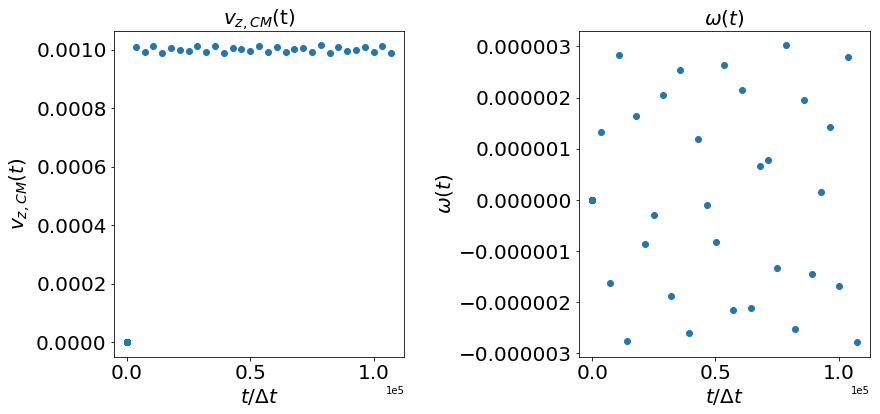

In [5]:
# Plotting the velocity of the squirmer (U=2/3B1) vs time (left plot):
# Plotting the omega of the squirmer (Omega=-C1/a with a radius of the squirmer) vs time (right plot):

rf = "/Users/federico/mnt/ebi/kapsel3/B1_fixed_B2_C2/2neg_3/output/data.h5"
f = h5py.File(rf, 'r')


fig,  (ex,gx) = plt.subplots(1,2,figsize=(15,6))
fig.subplots_adjust(left=0.2, wspace=0.6)


ex.set_xlabel('$t/\Delta t$',fontsize=20)
ex.set_ylabel('$v_{z,CM}(t)$',fontsize=20)
ex.tick_params(axis='both',labelsize=20)
ex.set_title('$v_{z,CM}$(t)',size=20)
ex.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
#ex.set_ylim(0,0.0012)

TIME=np.zeros(301)
V=np.zeros((301,3))


for n in range (0,301,10):
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    V[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/vel'].value


ex.plot(TIME,V[:,2],'o')

########################################

gx.set_xlabel('$t/\Delta t$',fontsize=20)
gx.set_ylabel('$\omega(t)$',fontsize=20)
gx.tick_params(axis='both',labelsize=20)
gx.set_title('$\omega(t)$',size=20)
gx.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

TIME=np.zeros(301)
Omeg=np.zeros((301,3))

for n in range (0,301,10):
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    Omeg[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/omega'].value


gx.plot(TIME,Omeg[:,2],'o')



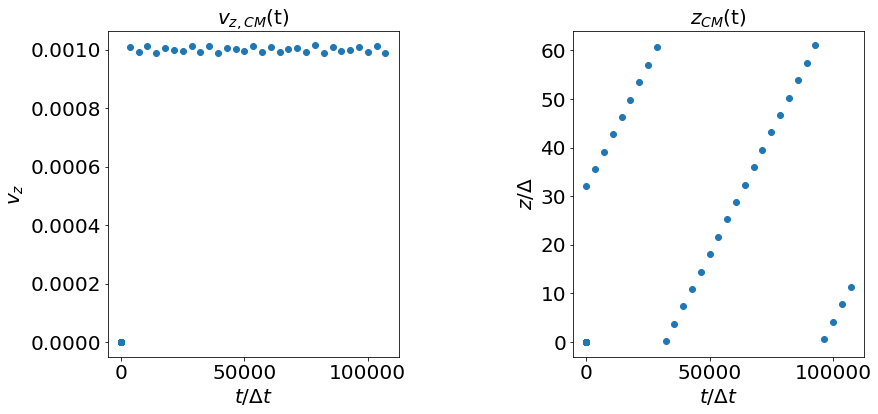

In [6]:
# Plotting the velocity of the squirmer (U=2/3B1) vs time (left plot):
# Plotting the position of the squirmer vs time (right plot):


rf = "/Users/federico/mnt/ebi/kapsel3/B1_fixed_B2_C2/2neg_3/output/data.h5"
f = h5py.File(rf, 'r')

fig,  (ex,fx) = plt.subplots(1,2,figsize=(15,6))
fig.subplots_adjust(left=0.2, wspace=0.6)


ex.set_xlabel('$t/\Delta t$',fontsize=20)
ex.set_ylabel('$v_z$',fontsize=20)
ex.tick_params(axis='both',labelsize=20)
ex.set_title('$v_{z,CM}$(t)',size=20)
#ex.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

TIME=np.zeros(301)
V=np.zeros((301,3))


for n in range (0,301,10):
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    V[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/vel'].value


ex.plot(TIME,V[:,2],'o')


###########################################


fx.set_xlabel('$t/\Delta t$',fontsize=20)
fx.set_ylabel('$z/\Delta$',fontsize=20)
fx.tick_params(axis='both',labelsize=20)
fx.set_title('$z_{CM}$(t)',size=20)
#fx.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

TIME=np.zeros(301)
ZCM=np.zeros((301,3))

for n in range (0,301,10):
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    ZCM[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value


fx.plot(TIME,ZCM[:,2],'o')

plt.show()

#fig.savefig('plotcircles.pdf')
 
    



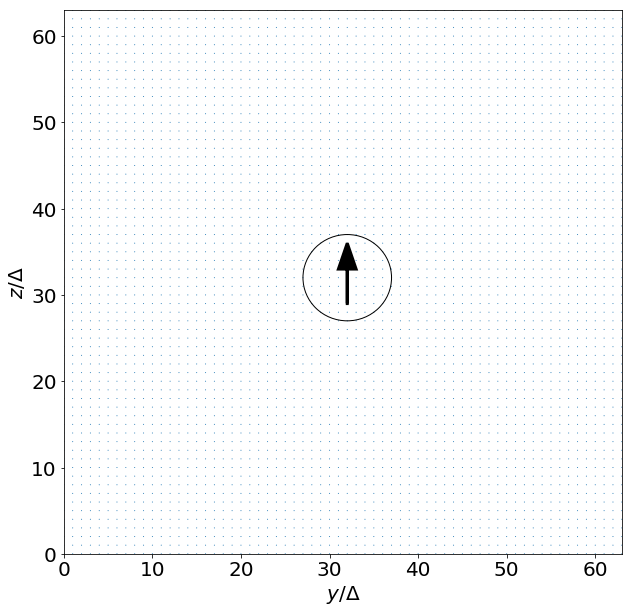

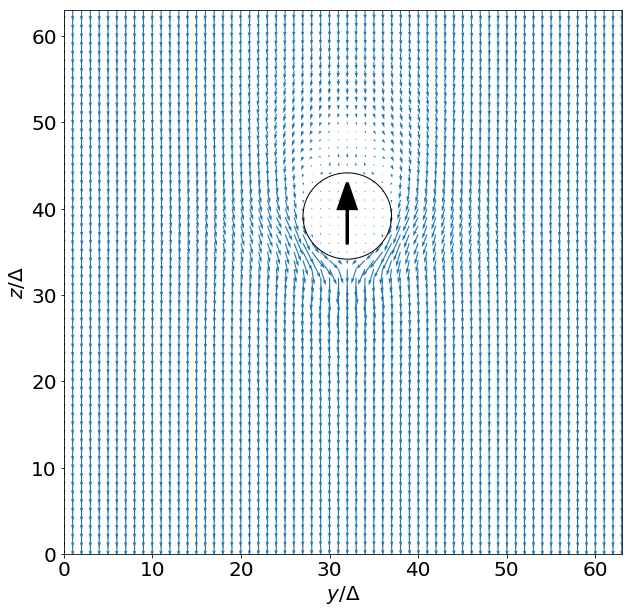

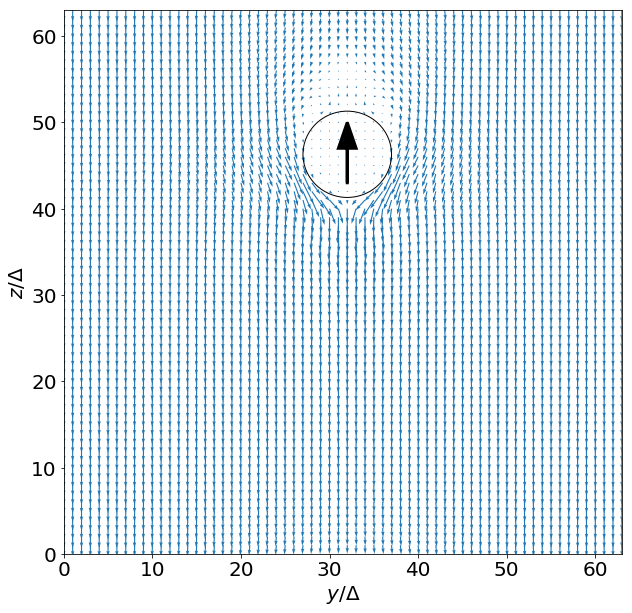

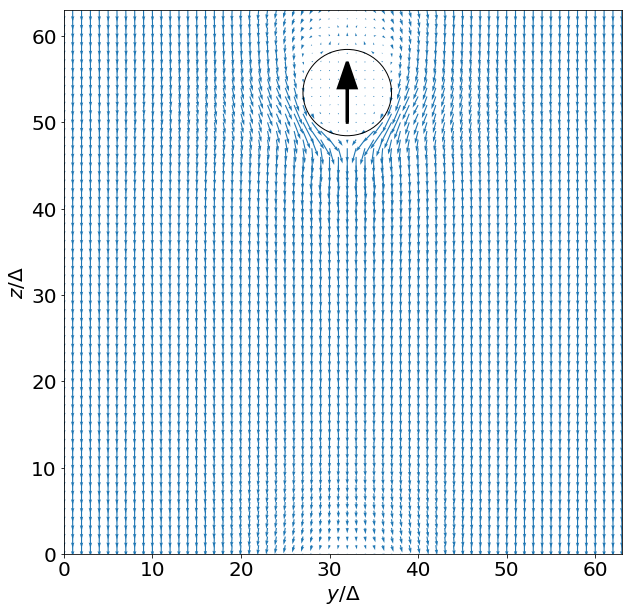

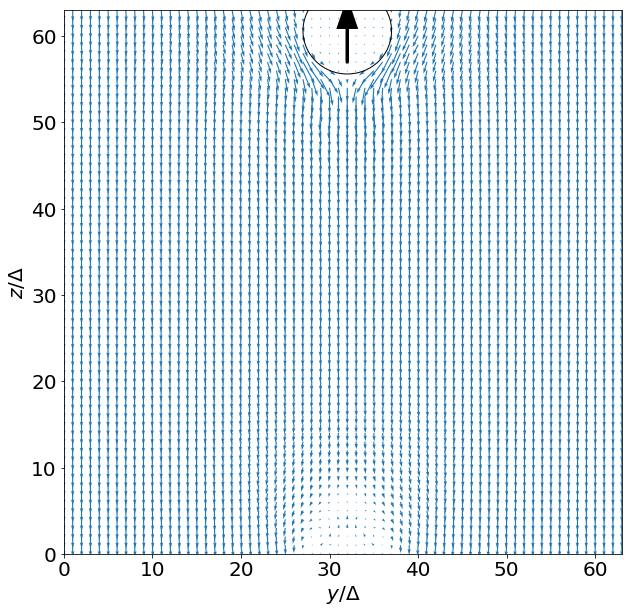

...

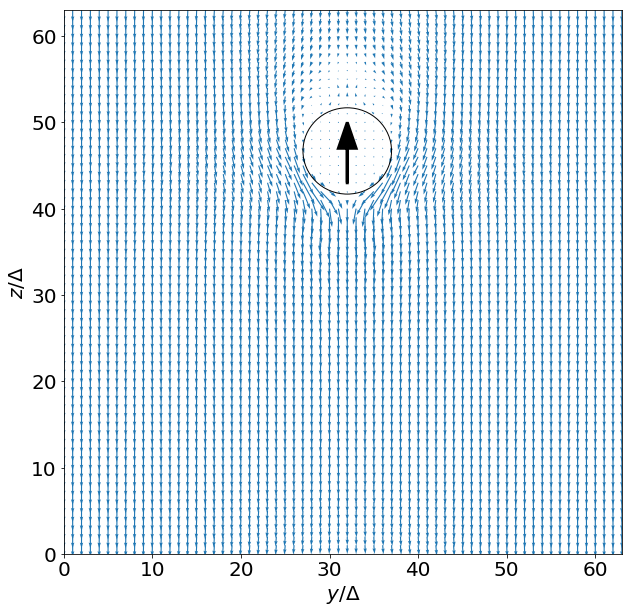

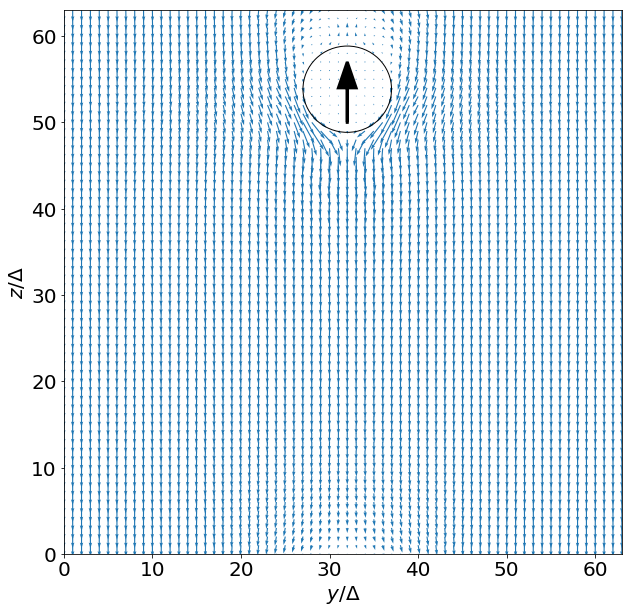

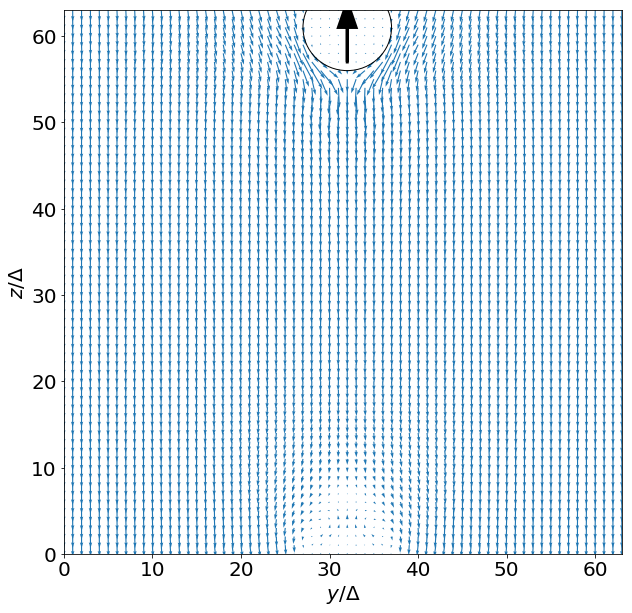

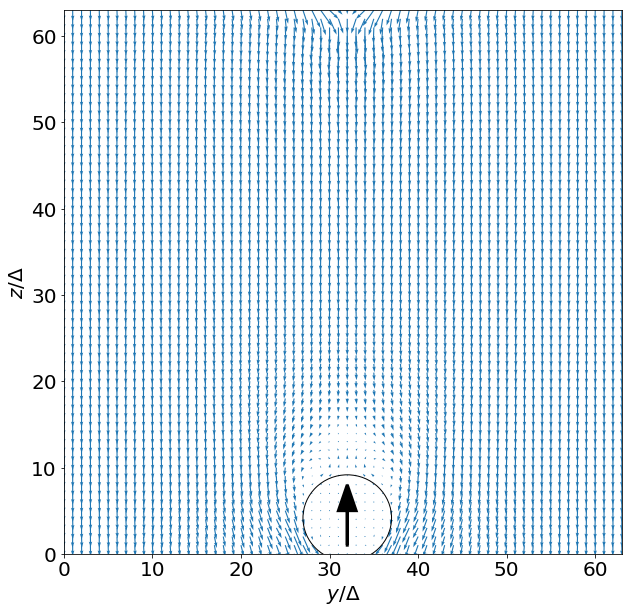

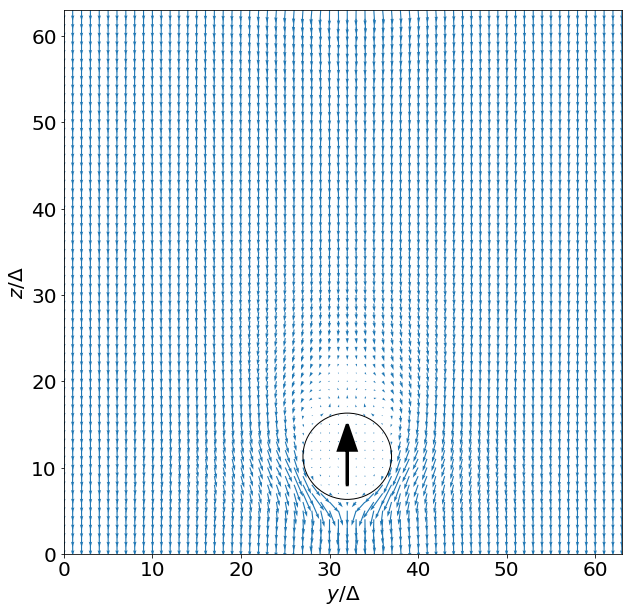

In [7]:
rf = "/Users/federico/mnt/ebi/kapsel3/B1_fixed_B2_C2/2neg_3/output/data.h5"
f = h5py.File(rf, 'r')

CM=np.zeros((301,3))
V=np.zeros((301,3))

for n in range (0,301,20): 
    
    



    X=f['system_data/field/x'].value
    Y=f['system_data/field/y'].value
    Z=f['system_data/field/z'].value

    UX=f['trajectory_data/frame_'+str(n)+'/field/u_x'].value
    UY=f['trajectory_data/frame_'+str(n)+'/field/u_y'].value
    UZ=f['trajectory_data/frame_'+str(n)+'/field/u_z'].value

#PHI=f['trajectory_data/frame_100/field/phi'].value
#UX=f['trajectory_data/frame_100/field/u_x'].value
#UY=f['trajectory_data/frame_100/field/u_y'].value
#UZ=f['trajectory_data/frame_100/field/u_z'].value
    
    CM[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    V[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/vel'].value
  
    
    fig, ax = plt.subplots(figsize=(10,10))

    circle=patches.Circle((CM[n,1],CM[n,2]),5,facecolor='None',edgecolor='black',linewidth=1,zorder=10)
    #circle=patches.Circle((0.0,0.0),5,facecolor='None',edgecolor='black',linewidth=1,zorder=10)
    

    #ax.streamplot(Y[32,:,32],Z[32,32,:],UY[32,:,:],UZ[32,:,:],arrowstyle='->',color='red',linewidth=1,arrowsize=2.0,density=2,zorder=1)
    ax.quiver(Y[32,:,:],Z[32,:,:],UY[32,:,:],UZ[32,:,:]-V[n,2],scale=0.05,width=0.002,color='C0',angles='uv',label='simulation')
    #ax.pcolormesh(X[:,:,33],Y[:,:,33],UY[:,:,33])
    #ax.quiver(X[:,32,:],Z[:,32,:],UX[:,32,:],UZ[:,32,:]-V[n,2],scale=0.05,width=0.002,color='C0',angles='uv',label='simulation')
    plt.xlabel('$y/\Delta$',fontsize=20)
    plt.ylabel('$z/\Delta$',fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.xlim((0,63))
    plt.ylim((0,63))


    ax.add_patch(circle)
    
    
    ax.arrow(int(CM[n,1]), int(CM[n,2])-3, 0.0, 4.0, linewidth=3.0, head_width=2.0, facecolor='black')

    fig.savefig('img_'+str(n)+'.png') 
    
    


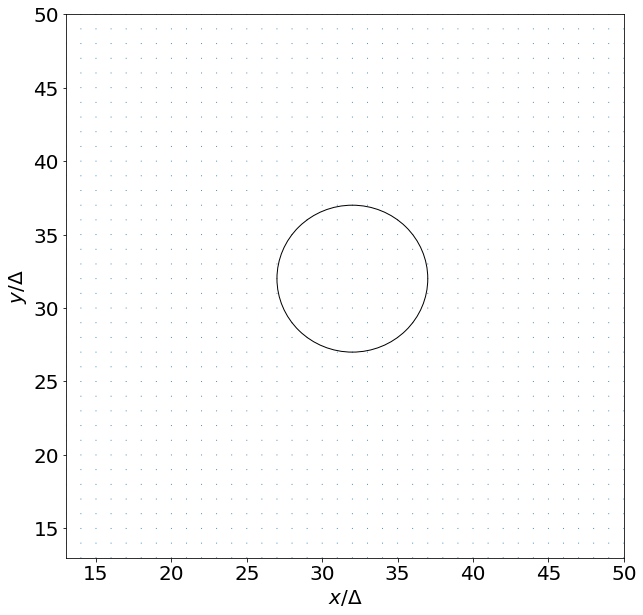

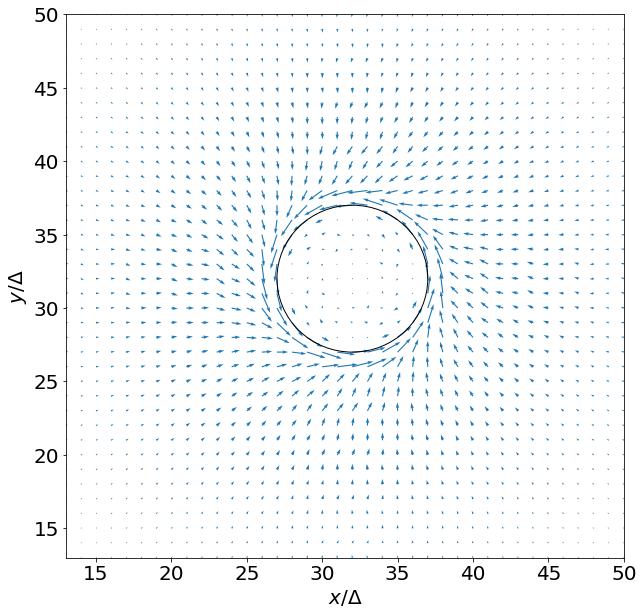

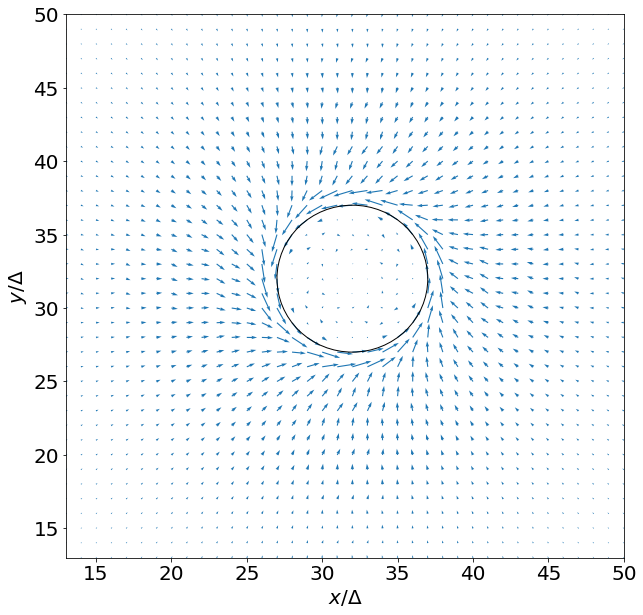

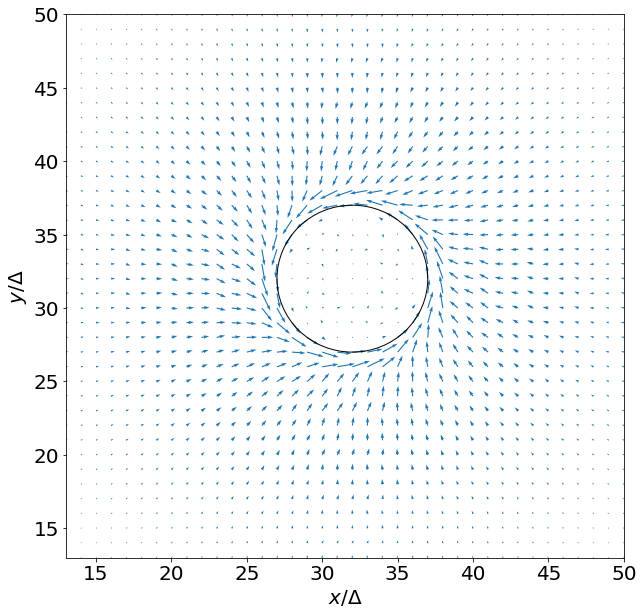

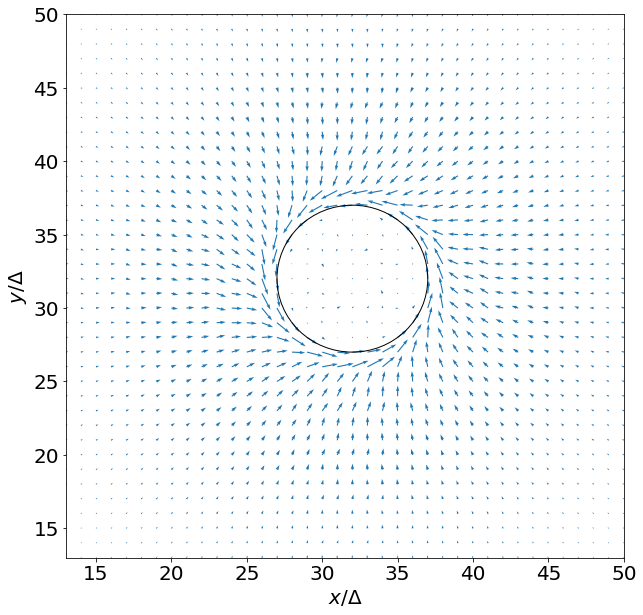

...

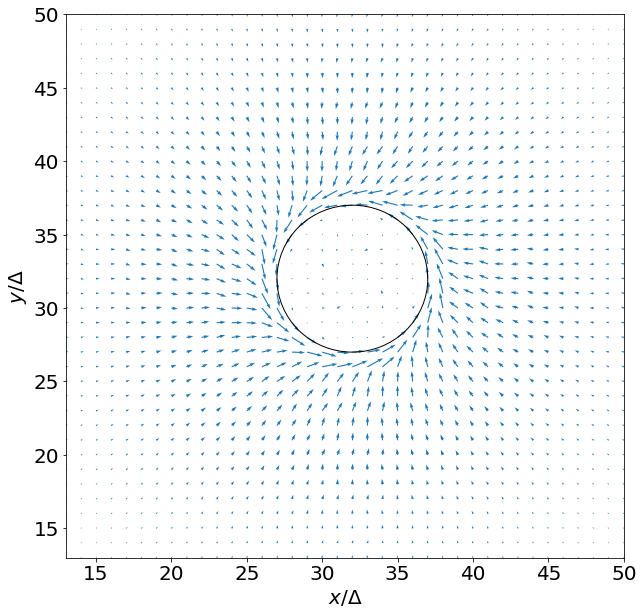

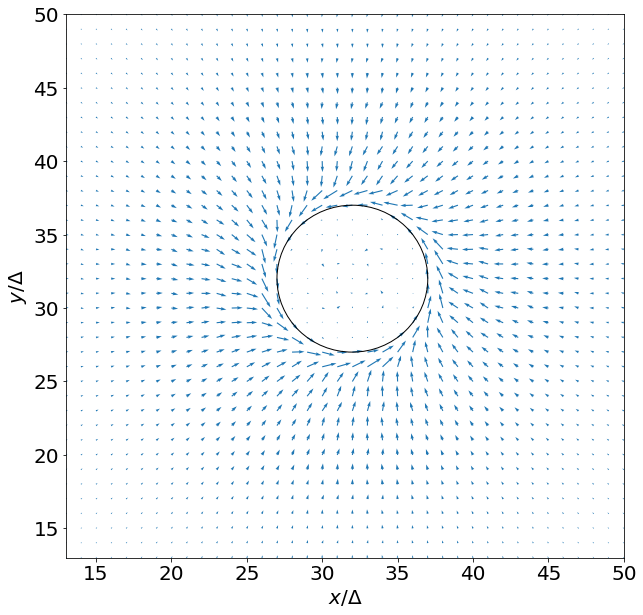

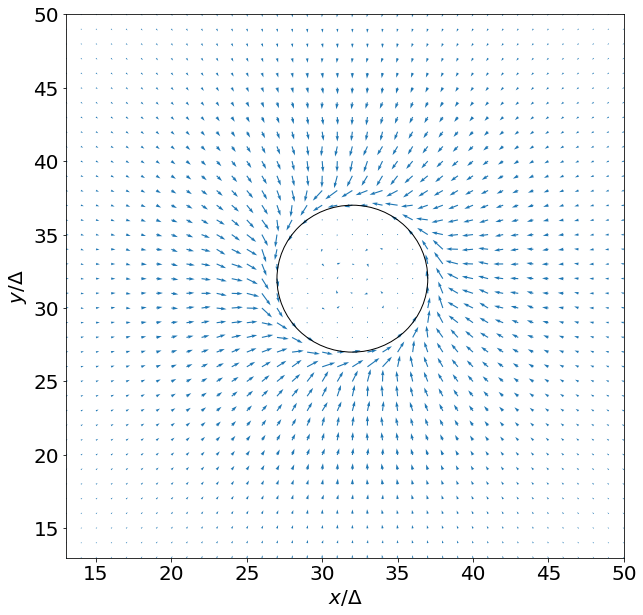

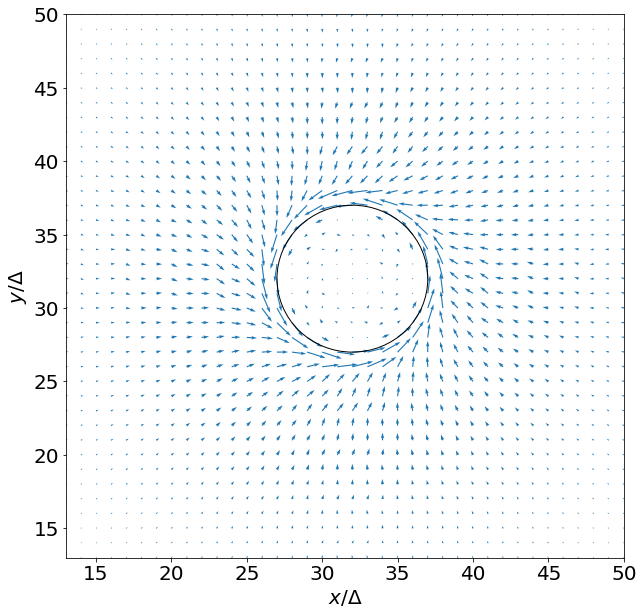

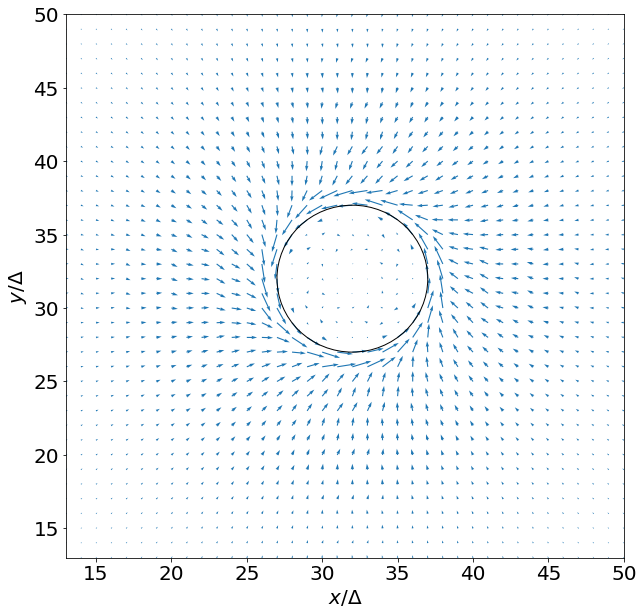

In [8]:
rf = "/Users/federico/mnt/ebi/kapsel3/B1_fixed_B2_C2/2neg_3/output/data.h5"
f = h5py.File(rf, 'r')

CM=np.zeros((301,3))

for n in range (0,301,20): 
    
    



    X=f['system_data/field/x'].value
    Y=f['system_data/field/y'].value
    Z=f['system_data/field/z'].value




    PHI=f['trajectory_data/frame_'+str(n)+'/field/phi'].value
    UX=f['trajectory_data/frame_'+str(n)+'/field/u_x'].value
    UY=f['trajectory_data/frame_'+str(n)+'/field/u_y'].value
    UZ=f['trajectory_data/frame_'+str(n)+'/field/u_z'].value

#PHI=f['trajectory_data/frame_100/field/phi'].value
#UX=f['trajectory_data/frame_100/field/u_x'].value
#UY=f['trajectory_data/frame_100/field/u_y'].value
#UZ=f['trajectory_data/frame_100/field/u_z'].value
    
    CM[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    
    
    fig, ax = plt.subplots(figsize=(10,10))

    circle=patches.Circle((CM[n,0],CM[n,1]),5,facecolor='None',edgecolor='black',linewidth=1,zorder=10)
#circle=patches.Circle((32,32),5,facecolor='White',edgecolor='black',linewidth=3,zorder=10)

#strm=ax.streamplot(X[:,0,31],Y[0,:,31],UX[:,:,31],UY[:,:,31],arrowstyle='->',color='C0',linewidth=1,arrowsize=2.0,density=4,zorder=1)
    ax.quiver(X[:,:,(int(CM[n,2])+2)],Y[:,:,(int(CM[n,2])+2)],UX[:,:,(int(CM[n,2])+2)],UY[:,:,(int(CM[n,2])+2)],scale=0.02, width=0.002,color='C0',angles='uv',label='simulation')
#ax.pcolormesh(X[:,:,33],Y[:,:,33],UY[:,:,33])
    plt.xlabel('$x/\Delta$',fontsize=20)
    plt.ylabel('$y/\Delta$',fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.xlim((13,50))
    plt.ylim((13,50))


    ax.add_patch(circle)

#nmax = 63
#x, y = np.mgrid[0:nmax, 0:nmax]
#a=5.0
#x_cm=32.0
#y_cm=32.0
#r=np.sqrt((x-x_cm)**2+(y-y_cm)**2)
#C1=0.0015
#C2=0.0015
#theta=np.pi*0.25

           
#phi=np.arctan2((y-y_cm),(x-x_cm))
                


#ux=(1/r**2)*np.sin(theta)*np.sin(phi)*C1*a**2+3.0*np.sin(2.0*theta)*C2*a**3*np.sin(phi)/(2.0*r**3)
#uy=-(1/r**2)*np.sin(theta)*np.cos(phi)*C1*a**2-3.0*np.sin(2.0*theta)*C2*a**3*np.cos(phi)/(2.0*r**3)
#inner = r < a
#ux[inner] = 0.0 #3e-4*(y[inner]-y_cm)
#uy[inner] = 0.0 #-3e-4*(x[inner]-x_cm)


#ax.quiver(x, y, ux, uy, scale=0.007, width=0.002,color='red',angles='uv',label='theory')
   
#plt.legend()
#plt.show()
    

    fig.savefig('img_down_'+str(n)+'.png') 
   




    





    
    

# Two interacting squirmers analysis

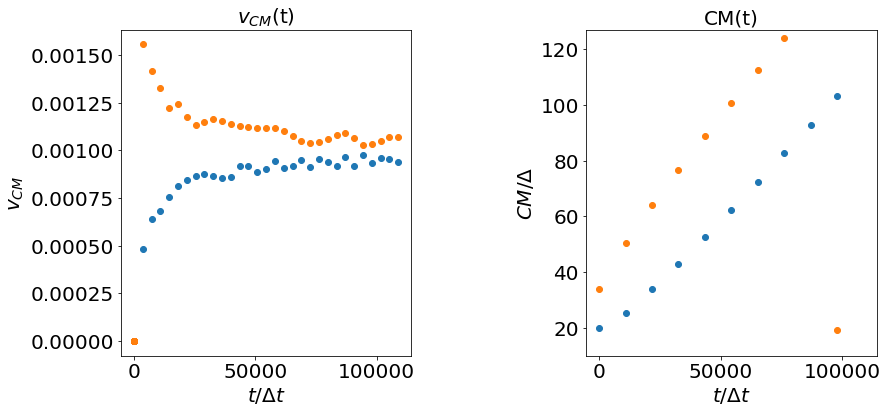

In [22]:
# Plotting the velocity of the two squirmers and their positions:


rf = "/Users/federico/mnt/ebi/kapsel3/2_squirmers_interaction_2/-5/14_2/output/data.h5"
f = h5py.File(rf, 'r')

fig,  (ex,fx) = plt.subplots(1,2,figsize=(15,6))
fig.subplots_adjust(left=0.2, wspace=0.6)


ex.set_xlabel('$t/\Delta t$',fontsize=20)
ex.set_ylabel('$v_{CM}$',fontsize=20)
ex.tick_params(axis='both',labelsize=20)
ex.set_title('$v_{CM}$(t)',size=20)
#ex.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

TIME=np.zeros(301)
V=np.zeros(((301,2,3)))
VTOT=np.zeros((301,3))
CM=np.zeros(((301,2,3)))

for n in range (0,301,10):
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    V[n,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/vel'].value
    
    VTOT[n,0]=np.sqrt(V[n,0,0]**2+V[n,0,1]**2+V[n,0,2]**2)
    VTOT[n,1]=np.sqrt(V[n,1,0]**2+V[n,1,1]**2+V[n,1,2]**2)


ex.plot(TIME,V[:,0,2],'o')
ex.plot(TIME,V[:,1,2],'o')
#ex.plot(TIME,VTOT[:,0],'o')
#ex.plot(TIME,VTOT[:,1],'o')

###########################################


fx.set_xlabel('$t/\Delta t$',fontsize=20)
fx.set_ylabel('$CM/\Delta$',fontsize=20)
fx.tick_params(axis='both',labelsize=20)
fx.set_title('CM(t)',size=20)
#plt.ylim((10,127))
#fx.ticklabel_format(style='sci', axis='x', scilimits=(0,0))


for n in range (0,300,30):
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    CM[n,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value


#fx.plot(TIME,CM[:,0,2],'o')
#fx.plot(TIME,CM[:,1,2],'o')
#fx.plot(TIME,abs(CM[:,0,2]-CM[:,1,2]),'o')

plt.show()

#2_pushersfig.savefig('plotcircles.pdf')



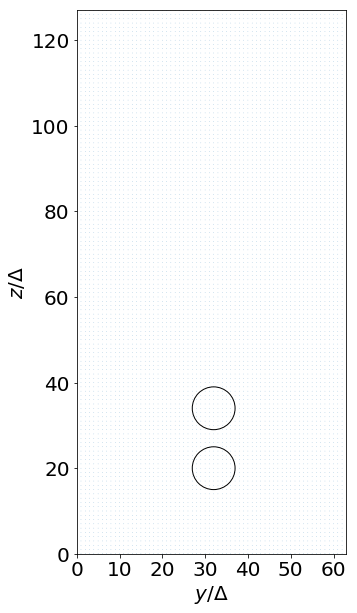

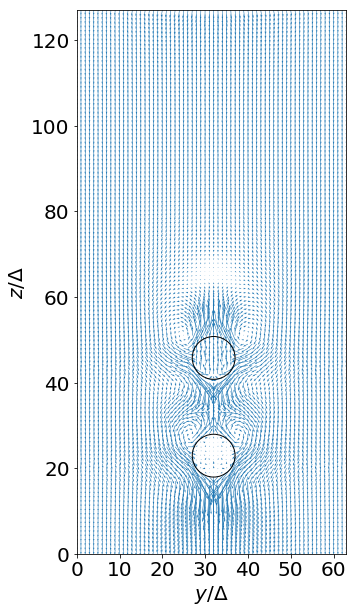

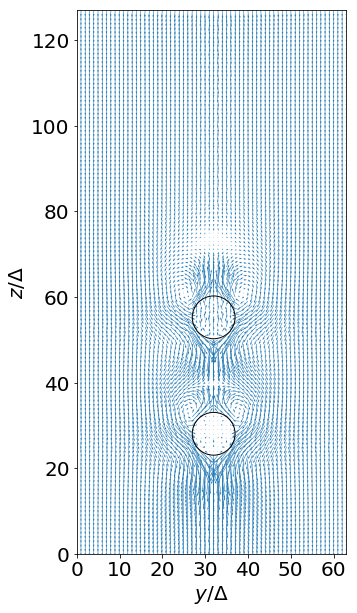

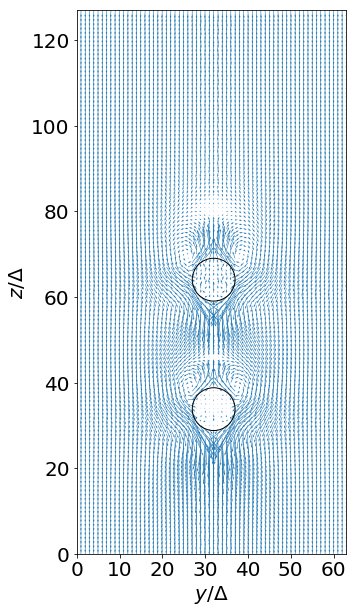

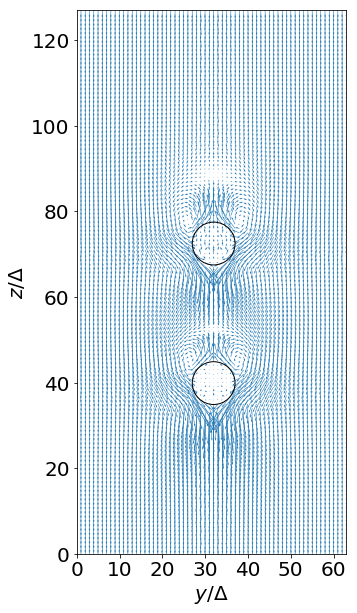

...

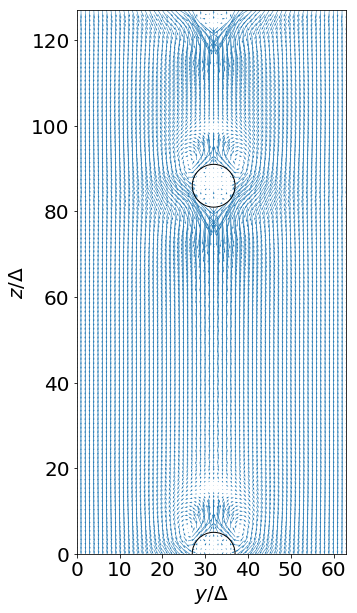

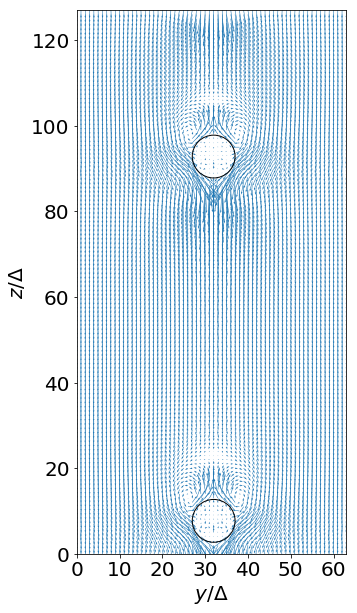

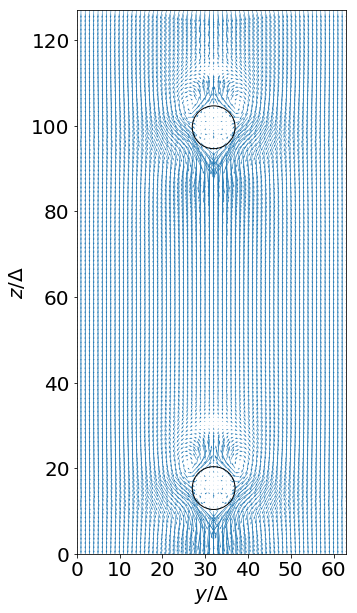

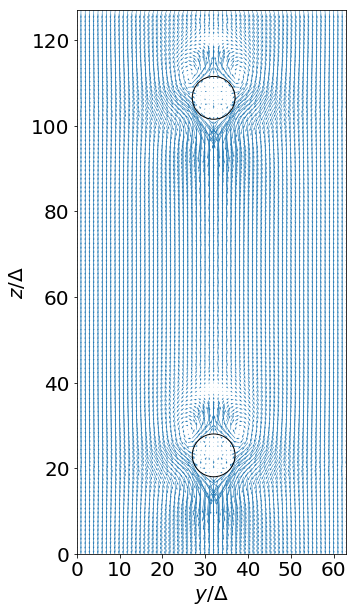

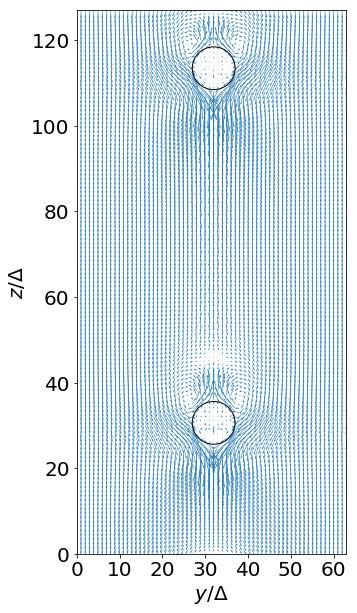

In [59]:
#### Plot uy and uz for two squimers:


rf = "/Users/federico/mnt/ebi/kapsel3/2_squirmers_interaction_2/-5/14/output/data.h5"
f = h5py.File(rf, 'r')

CM=np.zeros(((301,2,3)))
V=np.zeros(((301,2,3)))
VTOT=np.zeros((301,3))

for n in range (0,301,20): 
    
    



    X=f['system_data/field/x'].value
    Y=f['system_data/field/y'].value
    Z=f['system_data/field/z'].value




    PHI=f['trajectory_data/frame_'+str(n)+'/field/phi'].value
    UX=f['trajectory_data/frame_'+str(n)+'/field/u_x'].value
    UY=f['trajectory_data/frame_'+str(n)+'/field/u_y'].value
    UZ=f['trajectory_data/frame_'+str(n)+'/field/u_z'].value

#PHI=f['trajectory_data/frame_100/field/phi'].value
#UX=f['trajectory_data/frame_100/field/u_x'].value
#UY=f['trajectory_data/frame_100/field/u_y'].value
#UZ=f['trajectory_data/frame_100/field/u_z'].value
    
    CM[n,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    V[n,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/vel'].value
  
    
    fig, ax = plt.subplots(figsize=(10,10))
    
    VTOT[n,0]=np.sqrt(V[n,0,0]**2+V[n,0,1]**2+V[n,0,2]**2)

    circle=patches.Circle((CM[n,0,1],CM[n,0,2]),5,facecolor='None',edgecolor='black',linewidth=1,zorder=10)
    circle1=patches.Circle((CM[n,1,1],CM[n,1,2]),5,facecolor='None',edgecolor='black',linewidth=1,zorder=10)

#strm=ax.streamplot(X[:,0,31],Y[0,:,31],UX[:,:,31],UY[:,:,31],arrowstyle='->',color='C0',linewidth=1,arrowsize=2.0,density=4,zorder=1)
    ax.quiver(Y[int(CM[n,1,0]),:,:],Z[int(CM[n,1,0]),:,:],UY[int(CM[n,1,0]),:,:],UZ[int(CM[n,1,0]),:,:]-V[n,0,2],scale=0.03,width=0.002,color='C0',angles='uv',label='simulation')
#ax.pcolormesh(X[:,:,33],Y[:,:,33],UY[:,:,33])
    plt.xlabel('$y/\Delta$',fontsize=20)
    plt.ylabel('$z/\Delta$',fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.xlim((0,63))
    plt.ylim((0,127))

    ax.set_aspect('equal')
    
    ax.add_patch(circle)
    ax.add_patch(circle1)
    
    #ax.arrow(int(CM[n,0,1]), int(CM[n,0,2])-3, 0.0, 4.0, linewidth=3.0, head_width=2.0, facecolor='black')
    #ax.arrow(int(CM[n,1,1]), int(CM[n,1,2])-3, 0.0, 4.0, linewidth=3.0, head_width=2.0, facecolor='black')
    
    #ax.arrow(-7, -3, 0, 4, linewidth=3.0, head_width=2.0, facecolor='black')
    #ax.arrow(7, -3, 0, 4, linewidth=3.0, head_width=2.0, facecolor='black')

    fig.savefig('img_'+str(n)+'.png') 
    

    


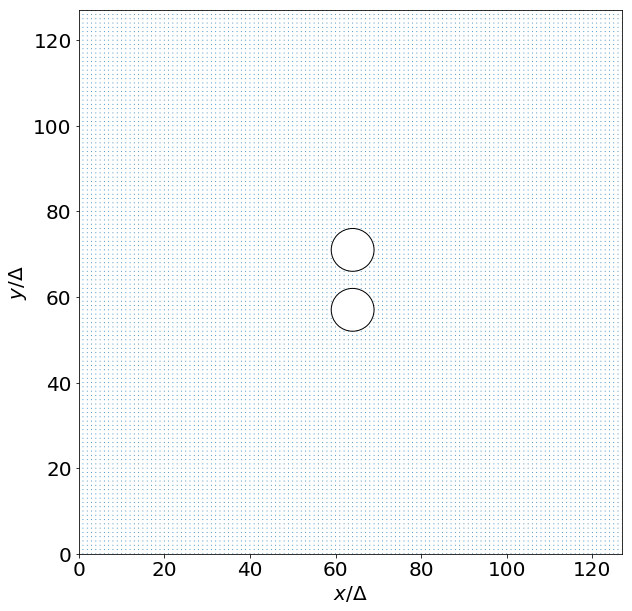

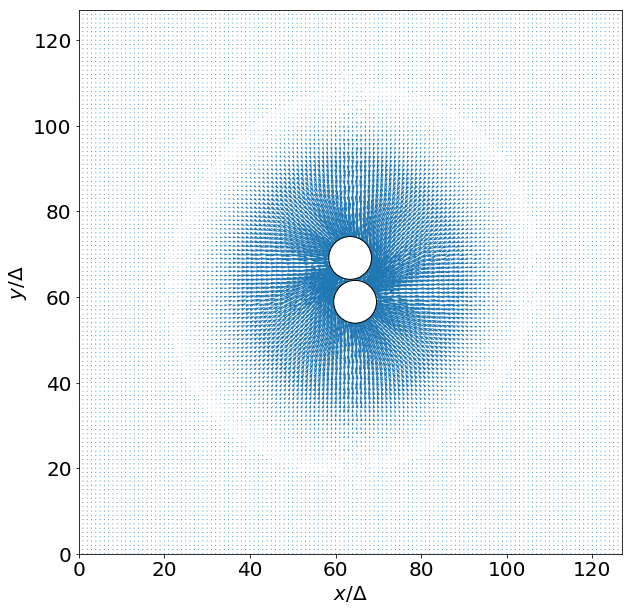

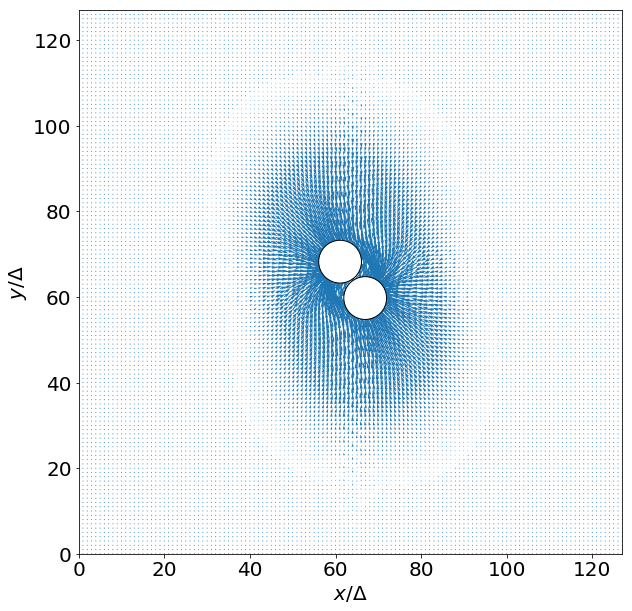

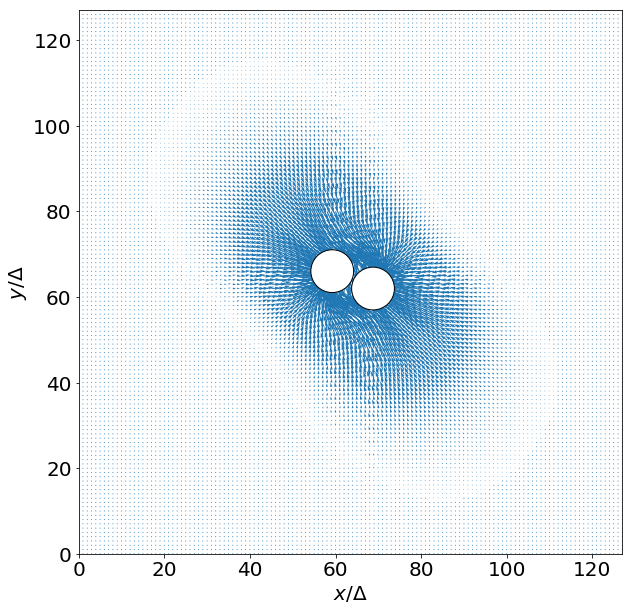

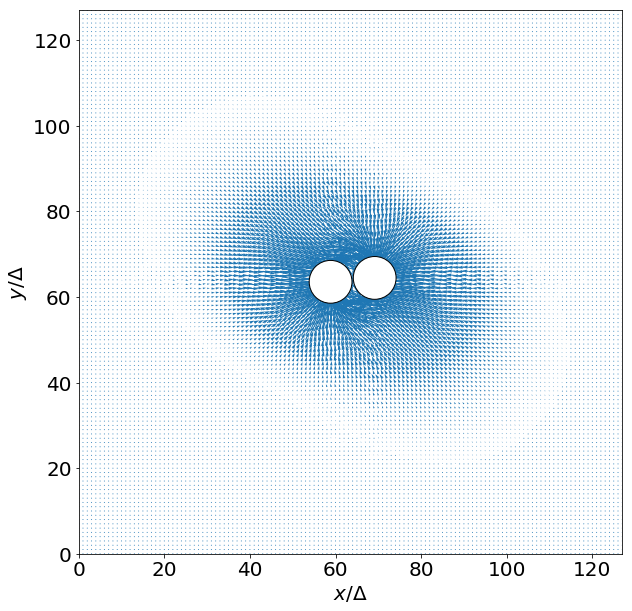

...

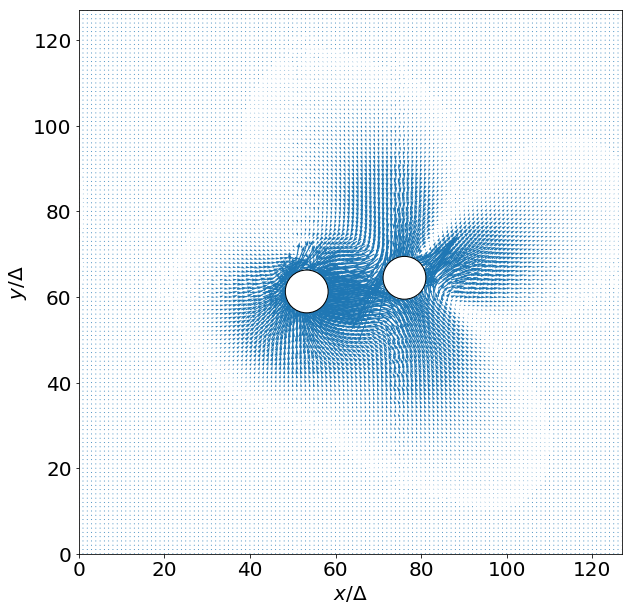

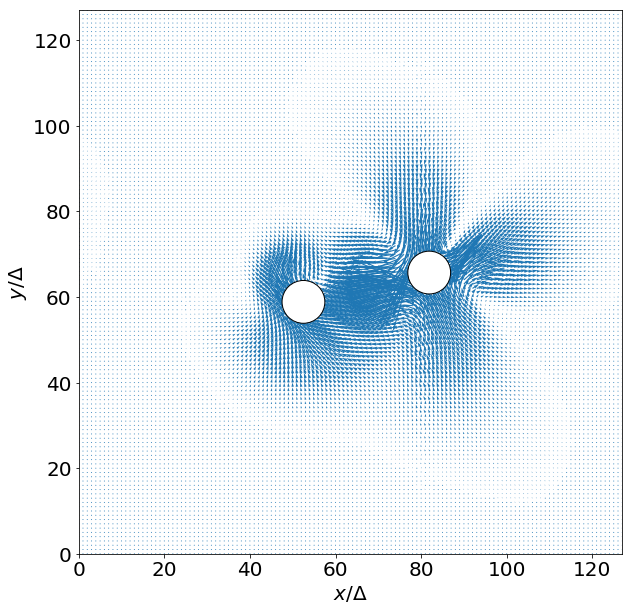

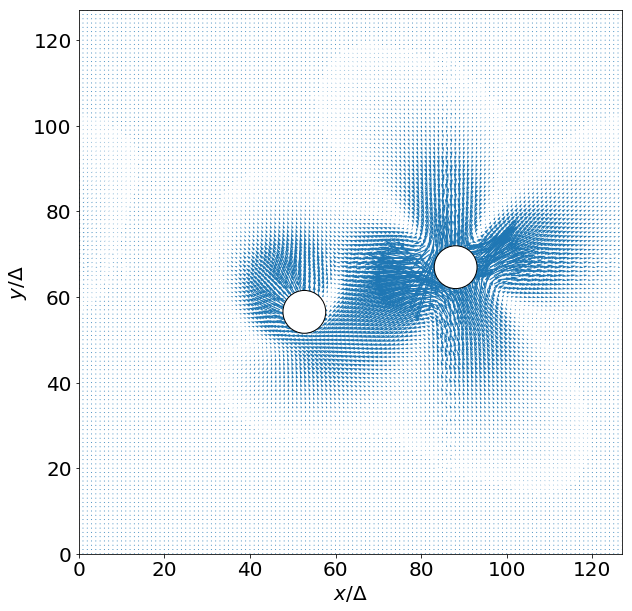

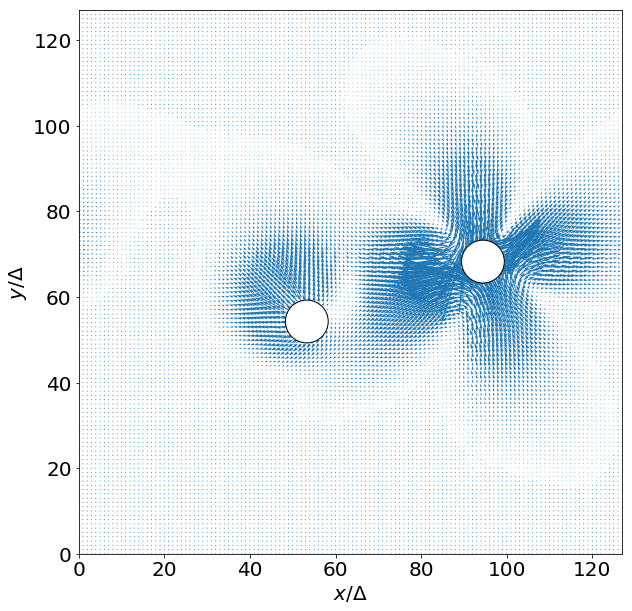

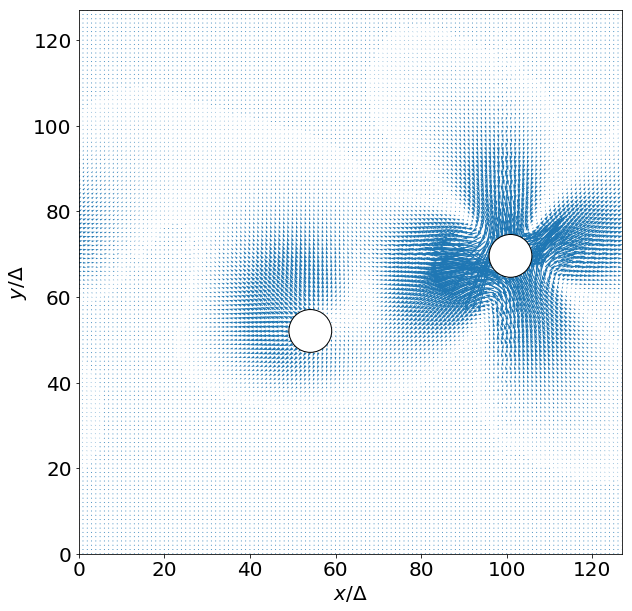

In [2]:
rf = "/Users/federico/mnt/ebi/kapsel3/2_squirmers_interaction_2/1/14/output/data.h5"
f = h5py.File(rf, 'r')

CM=np.zeros(((301,2,3)))

for n in range (0,301,20): 
    
    



    X=f['system_data/field/x'].value
    Y=f['system_data/field/y'].value
    Z=f['system_data/field/z'].value




    PHI=f['trajectory_data/frame_'+str(n)+'/field/phi'].value
    UX=f['trajectory_data/frame_'+str(n)+'/field/u_x'].value
    UY=f['trajectory_data/frame_'+str(n)+'/field/u_y'].value
    UZ=f['trajectory_data/frame_'+str(n)+'/field/u_z'].value

#PHI=f['trajectory_data/frame_100/field/phi'].value
#UX=f['trajectory_data/frame_100/field/u_x'].value
#UY=f['trajectory_data/frame_100/field/u_y'].value
#UZ=f['trajectory_data/frame_100/field/u_z'].value
    
    CM[n,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    
    fig, ax = plt.subplots(figsize=(10,10))

    circle=patches.Circle((CM[n,0,0],CM[n,0,1]),5,facecolor='White',edgecolor='black',linewidth=1,zorder=10)   
    circle1=patches.Circle((CM[n,1,0],CM[n,1,1]),5,facecolor='White',edgecolor='black',linewidth=1,zorder=10)

#strm=ax.streamplot(X[:,0,31],Y[0,:,31],UX[:,:,31],UY[:,:,31],arrowstyle='->',color='C0',linewidth=1,arrowsize=2.0,density=4,zorder=1)
    ax.quiver(X[:,:,int(CM[n,1,2])-2],Y[:,:,int(CM[n,1,2])-2],UX[:,:,int(CM[n,1,2])-2],UY[:,:,int(CM[n,1,2])-2],scale=0.02, width=0.002,color='C0',angles='uv',label='simulation')
#ax.pcolormesh(X[:,:,33],Y[:,:,33],UY[:,:,33])
    plt.xlabel('$x/\Delta$',fontsize=20)
    plt.ylabel('$y/\Delta$',fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.xlim((0,127))
    plt.ylim((0,63))
    
    ax.set_aspect('equal')


    ax.add_patch(circle)
    ax.add_patch(circle1)
    
    #ax.arrow(25, 64, -3, 0, linewidth=3.0, head_width=2.0, facecolor='black')
    
    fig.savefig('img_'+str(n)+'.png') 
    
    

In [37]:
rf = "/Users/federico/mnt/ebi/kapsel3/B1_fixed_B2_C2/2neg_3/output/data.h5"
f = h5py.File(rf, 'r')

CM=np.zeros((301,3))

for n in range (0,301): 
    
    



    X=f['system_data/field/x'].value
    Y=f['system_data/field/y'].value
    Z=f['system_data/field/z'].value




    PHI=f['trajectory_data/frame_'+str(n)+'/field/phi'].value
    UX=f['trajectory_data/frame_'+str(n)+'/field/u_x'].value
    UY=f['trajectory_data/frame_'+str(n)+'/field/u_y'].value
    UZ=f['trajectory_data/frame_'+str(n)+'/field/u_z'].value

    
    CM[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    
    xd=(CM[n,0]-(int(CM[n,0])+1))
    yd=(CM[n,1]-(int(CM[n,1])+1))
    zd=(CM[n,2]-(int(CM[n,2])+1))

    c000=UX[int(CM[n,0]),int(CM[n,1]),int(CM[n,2])]
    c100=UX[int(CM[n,0])+1,int(CM[n,1]),int(CM[n,2])]
    c00=c000*(1.0-xd)+c100*xd
         
    c001=UX[int(CM[n,0]),int(CM[n,1]),int(CM[n,2])+1]
    c101=UX[int(CM[n,0])+1,int(CM[n,1]),int(CM[n,2])+1]
    c01=c001*(1.0-xd)+c101*xd

    c010=UX[int(CM[n,0]),int(CM[n,1])+1,int(CM[n,2])]
    c110=UX[int(CM[n,0])+1,int(CM[n,1])+1,int(CM[n,2])]
    c10=c010*(1.0-xd)+c110*xd
         
    c011=UX[int(CM[n,0]),int(CM[n,1])+1,int(CM[n,2])+1]
    c111=UX[int(CM[n,0])+1,int(CM[n,1])+1,int(CM[n,2])+1]
    c11=c011*(1.0-xd)+c111*xd
         
    c0=c00*(1.0-yd)+c10*yd
    c1=c01*(1.0-yd)+c11*yd
         
    c=c0*(1-zd)+c1*zd

    print(c,UX[32,32,int(CM[n,2])])     
         

0.0 0.0
0.00010602593329164105 -2.552345e-20
7.08366298990264e-05 -1.7954679e-20
0.00011802418715520275 5.3507202e-20
0.00010638963741203781 -7.2871445e-20
5.2687366743242714e-05 1.9942152e-20
0.00011242630922719781 -6.34747e-20
0.00010358662984892567 -3.9622646e-20
3.654944994185837e-05 -2.0867296e-22
0.00011019105315228686 -9.8280746e-21
9.684267127829678e-05 2.838058e-20
2.2708469620588477e-05 -5.956393e-20
0.00010701219961350977 -2.0509822e-20
8.525817670972066e-05 -7.4290545e-20
0.0001260874776455396 -4.0516408e-20
0.00010614091590759015 -6.2900546e-20
6.879603793935548e-05 -1.0230092e-19
0.00011704992382113488 -4.3305968e-20
0.00010629466953013268 1.22404935e-20
5.0809441368537504e-05 -8.850142e-20
0.00011196738811020158 7.7327025e-21
0.00010309448213219384 1.0527303e-19
3.4899994288739225e-05 -6.958244e-20
0.00010980765543136522 -2.7017072e-21
9.571770052087292e-05 1.0383805e-19
2.1426472285874764e-05 -7.724936e-20
0.00010667557722501517 4.294201e-20
8.375557465473175e-05 3.6744

IndexError: index 64 is out of bounds for axis 2 with size 64

ValueError: The points in dimension 0 must be strictly ascending

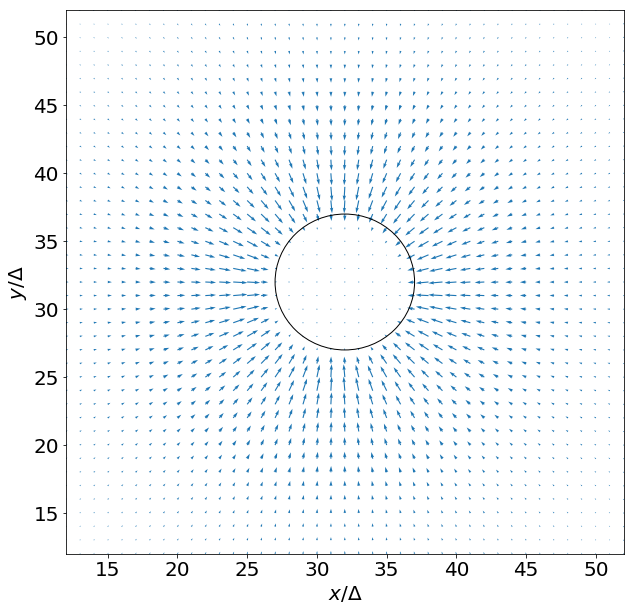

In [67]:
rf = "/Users/federico/mnt/ebi/kapsel3/B1_fixed_B2_C2/2neg_3/output/data.h5"
f = h5py.File(rf, 'r')

CM=np.zeros(3)
UX_INT=np.zeros((64,64))
UY_INT=np.zeros((64,64))

X=f['system_data/field/x'].value
Y=f['system_data/field/y'].value
Z=f['system_data/field/z'].value

UX=f['trajectory_data/frame_300/field/u_x'].value
UY=f['trajectory_data/frame_300/field/u_y'].value
UZ=f['trajectory_data/frame_300/field/u_z'].value

    
CM[:]=f['trajectory_data/frame_300/particle/pos'].value
    


for i in range(int(CM[0])-20,int(CM[0])+20):
    for j in range(int(CM[1])-20,int(CM[1])+20):
        
            xd=0.5
            yd=0.5
            zd=(CM[2]-int(CM[2]))
        
            cx000=UX[i,j,int(CM[2])]
            cx100=UX[i+1,j,int(CM[2])]
            cx00=cx000*(1.0-xd)+cx100*xd
         
            cx001=UX[i,j,int(CM[2])+1]
            cx101=UX[i+1,j,int(CM[2])+1]
            cx01=cx001*(1.0-xd)+cx101*xd

            cx010=UX[i,j+1,int(CM[2])]
            cx110=UX[i+1,j+1,int(CM[2])]
            cx10=cx010*(1.0-xd)+cx110*xd
         
            cx011=UX[i,j+1,int(CM[2])+1]
            cx111=UX[i+1,j+1,int(CM[2])+1]
            cx11=cx011*(1.0-xd)+cx111*xd
         
            cx0=cx00*(1.0-yd)+cx10*yd
            cx1=cx01*(1.0-yd)+cx11*yd
         
            UX_INT[i,j]=cx0*(1.0-zd)+cx1*zd

            
            cy000=UY[i,j,int(CM[2])]
            cy100=UY[i+1,j,int(CM[2])]
            cy00=cy000*(1.0-xd)+cy100*xd
         
            cy001=UY[i,j,int(CM[2])+1]
            cy101=UY[i+1,j,int(CM[2])+1]
            cy01=cy001*(1.0-xd)+cy101*xd

            cy010=UY[i,j+1,int(CM[2])]
            cy110=UY[i+1,j+1,int(CM[2])]
            cy10=cy010*(1.0-xd)+cy110*xd
         
            cy011=UY[i,j+1,int(CM[2])+1]
            cy111=UY[i+1,j+1,int(CM[2])+1]
            cy11=cy011*(1.0-xd)+cy111*xd
         
            cy0=cy00*(1.0-yd)+cy10*yd
            cy1=cy01*(1.0-yd)+cy11*yd
         
            UY_INT[i,j]=cy0*(1.0-zd)+cy1*zd
            

            
fig, ax = plt.subplots(figsize=(10,10))

circle=patches.Circle((CM[0],CM[1]),5,facecolor='None',edgecolor='black',linewidth=1,zorder=10)

ax.quiver(X[:,:,int(CM[2])+1],Y[:,:,int(CM[2]+1)],UX_INT[:,:],UY_INT[:,:],scale=0.02, width=0.002,color='C0',angles='uv',label='simulation')

plt.xlabel('$x/\Delta$',fontsize=20)
plt.ylabel('$y/\Delta$',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim((12,52))
plt.ylim((12,52))


ax.add_patch(circle)


#fig.savefig('img_.png')  



    